## Introduction

In this lab, you will learn how to convert addresses into their equivalent latitude and longitude values. Also, you will use the Foursquare API to explore neighborhoods in the City of Houston. You will use the **explore** function to get the most common venue categories in each neighborhood, and then use this feature to group the neighborhoods into clusters. You will use the *k*-means clustering algorithm to complete this task. Finally, you will use the Folium library to visualize the neighborhoods in Toronto City and their emerging clusters.

## Table of Contents

<div class="alert alert-block alert-info" style="margin-top: 20px">

<font size = 3>

1. <a href="#item1">Download and Explore Dataset</a>

2. <a href="#item2">Explore Neighborhoods in the City of Houston</a>

3. <a href="#item3">Analyze Each Neighborhood</a>

4. <a href="#item4">Cluster Neighborhoods</a>

5. <a href="#item5">Examine Clusters</a> 
    
6. <a href="#item5">Provide an example of a venue location selection (Starbucks)</a>    
</font>
</div>

Before we get the data and start exploring it, let's download all the dependencies that we will need.

In [1]:
# To get the location coordinates
! pip install geocoder
#For Web Scraping
! pip install BeautifulSoup4
from bs4 import BeautifulSoup
from urllib.request import Request, urlopen

import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
import geocoder # import geocoder
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

import requests # library to handle requests

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm


# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

     |████████████████████████████████| 102kB 6.0MB/s ta 0:00:011
     |████████████████████████████████| 92kB 6.2MB/s eta 0:00:011
     |████████████████████████████████| 829kB 8.6MB/s eta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/8b/99/a0/81daf51dcd359a9377b110a8a886b3895921802d2fc1b2397e
Successfully built future
     |████████████████████████████████| 112kB 6.2MB/s eta 0:00:01
Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.21.0               |             py_0          58 KB  conda-forge
    openssl-1.1.1g             |       h516909a_0         2.1 MB  conda-forge
    ------------------------------------------------------------
   

## 1. Download and Explore Dataset

#### Getting the Neighborhood Data

In [2]:
# The Data is collected from www.houstoniamag.com
url = 'https://www.houstoniamag.com/home-and-real-estate/2017/03/neighborhoods-by-the-numbers-real-estate-data-2017'
req = Request(url , headers={'User-Agent': 'Mozilla/5.0'})
webpage = urlopen(req).read()
soup = BeautifulSoup(webpage, "html.parser")

#### Creating the lists that will compose the Dataframe columns

In [3]:
#Collecting the Data from a particular Table in the html
Z=soup.find_all("table")[1:2]
A=[]
Data=Z[0].find_all("td")
for i in Data:
    A.append(i.text.strip())
B=[]
Z=soup.find_all("table")[2:3]
Data=Z[0].find_all("td")
for i in Data:
    B.append(i.text.strip())

In [4]:
#Forming the lists that will compose the DataFrame. Changing the values types of some columns from strings to integers and float numbers.
Neighborhood=[]
ZipCode=[]
Population=[]
MedianIncome=[]
MedianAge=[]
Unemployment=[]
EducationBachelor=[]
for i in range (0,(len(A)-7), 8):
    Neighborhood.append(A[i])
    ZipCode.append(A[i+1])
    Population.append(int((A[i+2]).replace(",", "")))
    MedianIncome.append(int((A[i+3]).replace(",", "").replace("$", "")))
    MedianAge.append(float(A[i+4]))   
    Unemployment.append(int((A[i+7]).replace("%", "")))  

for i in range (0,(len(B)-6), 7):
    EducationBachelor.append(int((B[i+2]).replace("%", ""))) 

#### Creating the Dataframe

In [5]:
df_Houston=pd.DataFrame({"Neighborhood":Neighborhood, "ZipCode":ZipCode, "Population":Population, "MedianIncome":MedianIncome, "EducationBachelor":EducationBachelor, "MedianAge":MedianAge, "Unemployment":Unemployment})
df_Houston.head()

,Neighborhood,ZipCode,Population,MedianIncome,EducationBachelor,MedianAge,Unemployment
0,1960/Cypress,77065,38585,56341,27,33.0,5
1,Aldine Area,77039,28711,37275,4,27.2,9
2,Alief,77072,59442,37143,13,32.4,10
3,Alvin North,77511,46333,51203,17,34.9,7
4,Alvin South,77511,46333,51203,17,34.9,7


#### Let's see the size of the DatFrame

In [6]:
df_Houston.shape

(147, 7)

#### Neighborhood Demographic Data Box Plots

In [7]:
def Boxplots(Data, title, label):
    Data.plot(kind="box", figsize=(8,6))
    plt.title(title)
    plt.ylabel(label)
    plt.show()

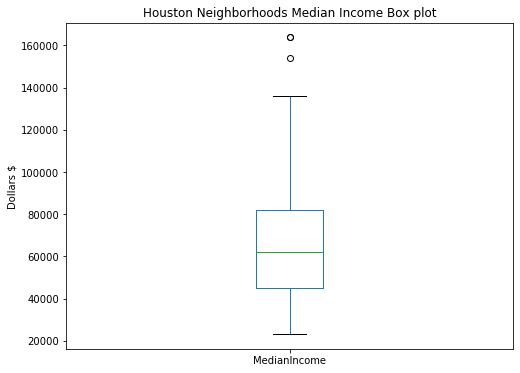

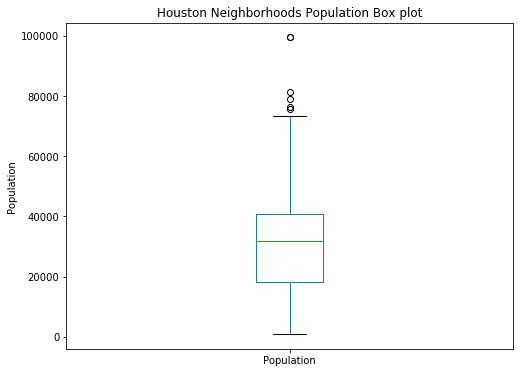

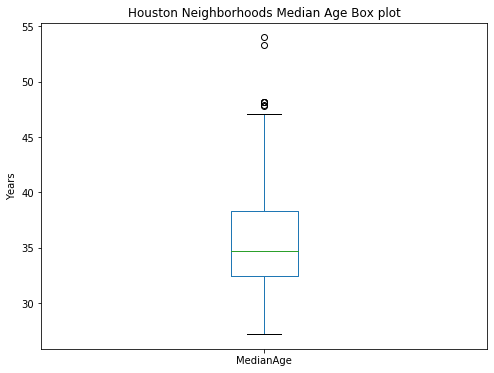

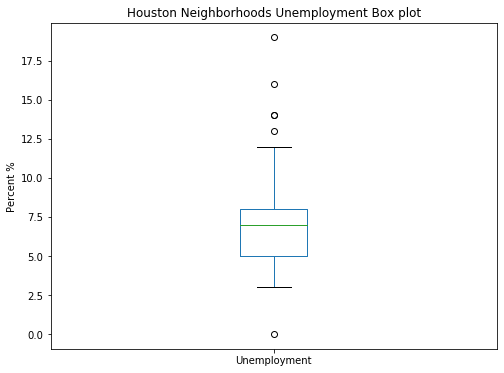

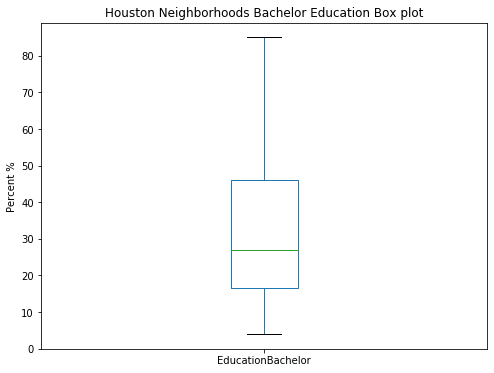

In [8]:
Boxplots(df_Houston['MedianIncome'], "Houston Neighborhoods Median Income Box plot", "Dollars $")
Boxplots(df_Houston['Population'], "Houston Neighborhoods Population Box plot", "Population")
Boxplots(df_Houston['MedianAge'], "Houston Neighborhoods Median Age Box plot", "Years")
Boxplots(df_Houston['Unemployment'], "Houston Neighborhoods Unemployment Box plot", "Percent %")
Boxplots(df_Houston['EducationBachelor'], "Houston Neighborhoods Bachelor Education Box plot", "Percent %")

In [9]:
df_var=df_Houston[['Population', 'MedianAge', 'Unemployment', 'EducationBachelor', "MedianIncome"]]
df_var.corr()['MedianIncome'].sort_values()

Unemployment        -0.671544
Population           0.138804
MedianAge            0.372763
EducationBachelor    0.766844
MedianIncome         1.000000
Name: MedianIncome, dtype: float64

#### Regression Plots of the Neighborhoods Demographic Data

#### Check which variables are correlated to income

In [10]:
# install seaborn
!conda install -c anaconda seaborn --yes

# import library
import seaborn as sns
print('Seaborn installed and imported!')

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - seaborn


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    blas-1.0                   |         openblas          48 KB  anaconda
    ca-certificates-2020.1.1   |                0         132 KB  anaconda
    certifi-2020.4.5.1         |           py36_0         159 KB  anaconda
    dbus-1.13.12               |       h746ee38_0         501 KB
    gst-plugins-base-1.14.0    |       hbbd80ab_1         4.8 MB
    gstreamer-1.14.0           |       hb453b48_1         3.1 MB
    matplotlib-3.1.3           |           py36_0          21 KB  anaconda
    matplotlib-base-3.1.3      |   py36hef1b27d_0         6.6 MB  anaconda
    openssl-1.1.1g             |       h7b6447c_0         3.8 MB  anaconda
    pyqt-5.9.2                 |   py36h22d08a2_1         5.6 M

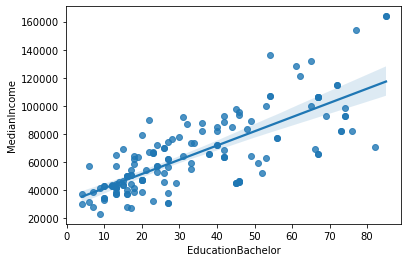

In [11]:
ax = sns.regplot(x='EducationBachelor', y='MedianIncome', data=df_Houston)

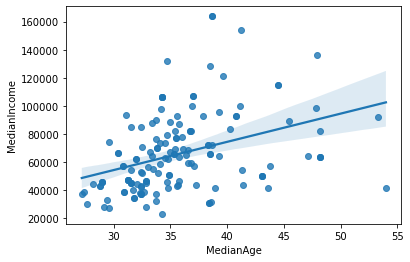

In [12]:
ax = sns.regplot(x='MedianAge', y='MedianIncome', data=df_Houston)

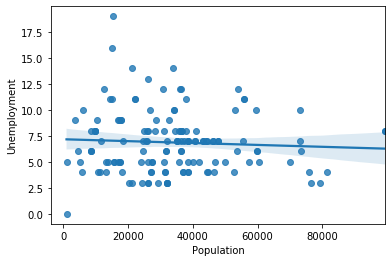

In [13]:
ax = sns.regplot(x='Population', y='Unemployment', data=df_Houston)

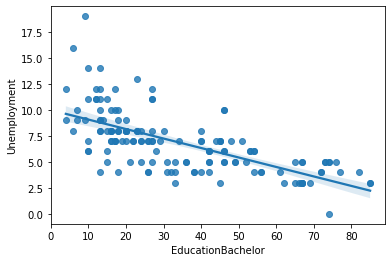

In [14]:
ax = sns.regplot(x='EducationBachelor', y='Unemployment', data=df_Houston)

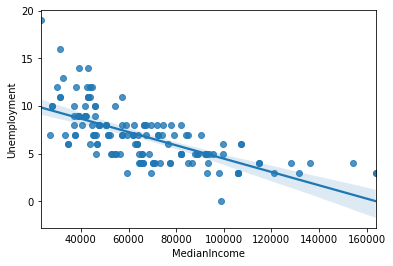

In [15]:
ax = sns.regplot(x='MedianIncome', y='Unemployment', data=df_Houston)

## 2.Explore Neighborhoods in the City of Houston

#### Get the Longitude and Latitude for all Neighborhoods using their Zip codes.

In [16]:
Latitude=[]
Longitude=[]
#Loop through the Zip codes to get their coordinates
for i in ZipCode:
    g = geocoder.bing(i , key="ApkJ_YW3amxJECIT91NvaLjIlTP1VNB8_R89EcdGAkiZ02vMymvhO427MVKOivLF")
    lat_lng_coords = g.json
    Latitude.append(lat_lng_coords["raw"]["point"]["coordinates"][0])
    Longitude.append(lat_lng_coords["raw"]["point"]["coordinates"][1])

#### Add the Latitude and Longitude to the DataFrame.

In [17]:
df_Houston["Latitude"]=Latitude
df_Houston["Longitude"]=Longitude
df_Houston.head()

,Neighborhood,ZipCode,Population,MedianIncome,EducationBachelor,MedianAge,Unemployment,Latitude,Longitude
0,1960/Cypress,77065,38585,56341,27,33.0,5,29.928425,-95.607101
1,Aldine Area,77039,28711,37275,4,27.2,9,29.911270,-95.336487
2,Alief,77072,59442,37143,13,32.4,10,29.700073,-95.584854
3,Alvin North,77511,46333,51203,17,34.9,7,29.402740,-95.261040
4,Alvin South,77511,46333,51203,17,34.9,7,29.402740,-95.261040


#### Use geopy library to get the latitude and longitude values of the City of Houston.

In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent <em>Hou_explorer</em>, as shown below.

In [18]:
address = 'Houston, TX'

geolocator = Nominatim(user_agent="Hou_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Houston are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Houston are 29.7589382, -95.3676974.


<a id='item1'></a>

#### Create a map of Houston with neighborhoods superimposed on top.
#### The first map shows the size of the Population represented by the size of the marker
#### The second map shows the Neighborhood Income represented by the size of the marker
#### The third map shows the product of population and Income, this new variable is believed to indicate the market size in the neighborhood 

In [19]:
# Add the Neighborhood locations with markers radius proportion to Population
map_Population = folium.Map(location=[latitude, longitude], zoom_start=9)

# add markers to map
for lat, lng, zipcode, neighborhood, population in zip(df_Houston['Latitude'], df_Houston['Longitude'], df_Houston['ZipCode'], df_Houston['Neighborhood'], df_Houston['Population']):
    label = '{}, {}'.format(neighborhood, zipcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.0001*population,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Population)  
    
map_Population

**Folium** is a great visualization library. Feel free to zoom into the above map, and click on each circle mark to reveal the name of the neighborhood and its respective Zip Code.

In [20]:
# Add the Neighborhood locations with markers radius proportion to Income
map_Income = folium.Map(location=[latitude, longitude], zoom_start=9)

# add markers to map
for lat, lng, zipcode, neighborhood, income in zip(df_Houston['Latitude'], df_Houston['Longitude'], df_Houston['ZipCode'], df_Houston['Neighborhood'], df_Houston['MedianIncome']):
    label = '{}, {}'.format(neighborhood, zipcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.00004*income,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Income)  
    
map_Income

#### Let's create a map that shows the effect of both the Population and Income
#### A new variable is created equals to the product of population and Income 

In [21]:
df_wealthy_populated=df_Houston['MedianIncome'].mul(df_Houston['Population'], axis=0)
df_wealthy_populated=pd.DataFrame(df_wealthy_populated)

In [22]:
# create map of Houston using latitude and longitude values
# Add the Neighborhood locations with markers radius proportion to the product of wealth and population
map_wealthy_populated = folium.Map(location=[latitude, longitude], zoom_start=9)
# add markers to map
for lat, lng, zipcode, neighborhood, Wealth_population in zip(df_Houston['Latitude'], df_Houston['Longitude'], df_Houston['ZipCode'], df_Houston['Neighborhood'], df_wealthy_populated[0]):
    label = '{}, {}'.format(neighborhood, zipcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.000000001*Wealth_population,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_wealthy_populated)  
    
map_wealthy_populated

#### We are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.

#### Define Foursquare Credentials and Version

In [23]:
CLIENT_ID = 'SMYWOYKTREILMWRR0TFQS3D3RT502TWFIZ2CD111QKYXFQJY' # your Foursquare ID
CLIENT_SECRET = '2J3C4CAASBBBPPLPUVXLMR5XO2HO3R41E1HOVVGTPMY0CGSX' # your Foursquare Secret
VERSION = '20190605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: SMYWOYKTREILMWRR0TFQS3D3RT502TWFIZ2CD111QKYXFQJY
CLIENT_SECRET:2J3C4CAASBBBPPLPUVXLMR5XO2HO3R41E1HOVVGTPMY0CGSX


<a id='item2'></a>

#### Let's create a function to get the top 100 venues within 2000 meters from each neighborhood in Houston

In [24]:
def getNearbyVenues(names, latitudes, longitudes, radius=2000, LIMIT=100):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [25]:


Houston_venues = getNearbyVenues(names=df_Houston['Neighborhood'],
                                   latitudes=df_Houston['Latitude'],
                                   longitudes=df_Houston['Longitude']
                                  )



1960/Cypress
Aldine Area
Alief
Alvin North
Alvin South
Atascocita North
Atascocita South
Bacliff/San Leon
Bayou Vista
Baytown/Chambers County
Baytown/Harris County
Bear Creek
Bellaire
Braeswood Place
Brays Oaks
Briargrove
Briargrove Park/Walnut Bend
Briarmeadow/Tanglewilde
Brookshire
Chambers County East
Chambers County West
Champions Area
Charnwood/Briarbend
Clear Lake Area
Cleveland Area
Coldspring/South San Jacinto County
Conroe Northeast
Conroe Southeast
Conroe Southwest
Copperfield Area
Cottage Grove
Crosby Area
Crystal Beach
Cypress North
Cypress South
Dayton
Deer Park
Denver Harbor
Dickinson
East End-Galveston
East End Revitalized
Eldridge North
Energy Corridor
Fall Creek Area
Five Corners
Fort Bend County North/Richmond
Fort Bend Southeast
Friendswood
Fulshear/South Brookshire/Simonton
Galleria
Garden Oaks
Greenway Plaza
Gulfton
Heights/Greater Heights
Hempstead
Highland Village/Midlane
Hitchcock
Hobby Area
Hockley
Huffman Area
Humble Area East
Humble Area South
Humble Area Wes

#### Let's check the size of the resulting dataframe

In [26]:
print(Houston_venues.shape)
Houston_venues.head()

(7338, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,1960/Cypress,29.928425,-95.607101,Chick-fil-A,29.922471,-95.602292,Fast Food Restaurant
1,1960/Cypress,29.928425,-95.607101,Schlotzsky's,29.924390,-95.600391,Restaurant
2,1960/Cypress,29.928425,-95.607101,Panera Bread,29.923905,-95.601578,Bakery
3,1960/Cypress,29.928425,-95.607101,Petco,29.924462,-95.602744,Pet Store
4,1960/Cypress,29.928425,-95.607101,Raising Cane's Chicken Fingers,29.923184,-95.600641,Fried Chicken Joint


#### Let's see how the venues are distributed on the map

In [27]:
# create map of Houston using latitude and longitude values
map_Houston_Venues = folium.Map(location=[latitude, longitude], zoom_start=9)

# add markers to map
for lat, lng in zip(Houston_venues['Venue Latitude'], Houston_venues['Venue Longitude']):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Houston_Venues)  
map_Houston_Venues

#### Let's check how many venues were returned for each neighborhood

In [28]:
df_NeiborhoodCount=pd.DataFrame((Houston_venues.groupby('Neighborhood').count()).iloc[:, 0])
df_NeiborhoodCount=df_NeiborhoodCount.rename(columns={"Neighborhood Latitude": "Venue Count"})
df_NeiborhoodCount.reset_index()

,Neighborhood,Venue Count
0,1960/Cypress,100
1,Aldine Area,20
2,Alief,90
3,Alvin North,26
4,Alvin South,26
5,Atascocita North,55
6,Atascocita South,59
7,Bacliff/San Leon,31
8,Bayou Vista,9
9,Baytown/Chambers County,51


#### Let's find out how many unique categories can be curated from all the returned venues

In [29]:
print('There are {} uniques categories.'.format(len(Houston_venues['Venue Category'].unique())))

There are 350 uniques categories.


#### Let's check the relationship between the population and Venue Count in the Neighborhoods.

In [30]:
df_Population_VenueCount=df_NeiborhoodCount.merge(df_Houston.iloc[:, [0, 2]], on="Neighborhood")
df_Population_VenueCount.head()

,Neighborhood,Venue Count,Population
0,1960/Cypress,100,38585
1,Aldine Area,20,28711
2,Alief,90,59442
3,Alvin North,26,46333
4,Alvin South,26,46333


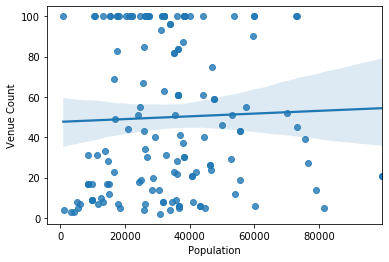

In [31]:
ax = sns.regplot(x='Population', y='Venue Count', data=df_Population_VenueCount)

#### It looks like there no clear relationship between Population and the number of venues

<a id='item3'></a>

## 3. Analyze Each Neighborhood

In [32]:
# one hot encoding
Houston_onehot = pd.get_dummies(Houston_venues[['Venue Category']], prefix="", prefix_sep="")
# add neighborhood column back to dataframe
Houston_onehot= pd.concat([Houston_venues['Neighborhood'], Houston_onehot], axis=1, sort=False)
Houston_onehot.head()

,Neighborhood,Accessories Store,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Station,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Caribbean Restaurant,Carpet Store,Casino,Check Cashing Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Clothing Store,Cocktail Bar,Coffee Shop,College Baseball Diamond,College Classroom,College Football Field,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Eye Doctor,Fabric Shop,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Lawyer,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Mongolian Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Opera House,Optical Shop,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pizza Place,Platform,Playground,Plaza,Pool,Port,Portuguese Restaurant,Print Shop,Professional & Other Places,Pub,RV Park,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Rental Car Location,Rental Service,Residential Building (

In [33]:
# one hot encoding
Houston_onehot = pd.get_dummies(Houston_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Houston_onehot['Neighborhood'] = Houston_venues['Neighborhood'] 
Houston_onehot.head()

,Accessories Store,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Station,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Caribbean Restaurant,Carpet Store,Casino,Check Cashing Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Clothing Store,Cocktail Bar,Coffee Shop,College Baseball Diamond,College Classroom,College Football Field,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Eye Doctor,Fabric Shop,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Lawyer,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Mongolian Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Opera House,Optical Shop,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pizza Place,Platform,Playground,Plaza,Pool,Port,Portuguese Restaurant,Print Shop,Professional & Other Places,Pub,RV Park,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Rental Car Location,Rental Service,Residential Building (Apartment / C

#### And let's examine the new dataframe size.

In [34]:
Houston_onehot.shape

(7338, 350)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [35]:
Houston_grouped = Houston_onehot.groupby('Neighborhood').mean().reset_index()
Houston_grouped

,Neighborhood,Accessories Store,Advertising Agency,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Assisted Living,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Bath House,Bay,Beach,Beer Bar,Beer Garden,Beer Store,Beijing Restaurant,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bistro,Board Shop,Boat or Ferry,Bookstore,Border Crossing,Boutique,Bowling Alley,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burrito Place,Bus Station,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Caribbean Restaurant,Carpet Store,Casino,Check Cashing Service,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Clothing Store,Cocktail Bar,Coffee Shop,College Baseball Diamond,College Classroom,College Football Field,College Residence Hall,Comedy Club,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Disc Golf,Discount Store,Distribution Center,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Service,Event Space,Eye Doctor,Fabric Shop,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Financial or Legal Service,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Service,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Go Kart Track,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Insurance Office,Internet Cafe,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Lawyer,Light Rail Station,Lighting Store,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Mongolian Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Nightclub,Non-Profit,Noodle House,Opera House,Optical Shop,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Outlet Store,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Pawn Shop,Pedestrian Plaza,Performing Arts Venue,Persian Restaurant,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pizza Place,Platform,Playground,Plaza,Pool,Port,Portuguese Restaurant,Print Shop,Professional & Other Places,Pub,RV Park,Racetrack,Ramen Restaurant,Record Shop,Recording Studio,Recreation Center,Rental Car Location,Rental Service,Residential Building (Apartment / C

#### Let's confirm the new size

In [36]:
Houston_grouped.shape

(147, 350)

#### Let's print each neighborhood along with the top 5 most common venues

In [37]:
num_top_venues = 5

for hood in Houston_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Houston_grouped[Houston_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----1960/Cypress----
                  venue  freq
0  Fast Food Restaurant  0.07
1    Mexican Restaurant  0.06
2        Sandwich Place  0.05
3                 Hotel  0.04
4              Pharmacy  0.03


----Aldine Area----
               venue  freq
0         Taco Place  0.10
1        Pizza Place  0.10
2     Discount Store  0.10
3        Gas Station  0.10
4  Mobile Phone Shop  0.05


----Alief----
                   venue  freq
0  Vietnamese Restaurant  0.24
1       Asian Restaurant  0.08
2        Bubble Tea Shop  0.07
3         Discount Store  0.03
4           Noodle House  0.03


----Alvin North----
                  venue  freq
0   Fried Chicken Joint  0.08
1   American Restaurant  0.08
2                  Park  0.08
3  Gym / Fitness Center  0.08
4  Fast Food Restaurant  0.08


----Alvin South----
                  venue  freq
0   Fried Chicken Joint  0.08
1   American Restaurant  0.08
2                  Park  0.08
3  Gym / Fitness Center  0.08
4  Fast Food Restaurant  0.08


----Ata

#### Let's put that into a *pandas* dataframe

First, let's write a function to sort the venues in descending order.

In [38]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [39]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Houston_grouped['Neighborhood']

for ind in np.arange(Houston_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Houston_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1960/Cypress,Fast Food Restaurant,Mexican Restaurant,Sandwich Place,Hotel,Pharmacy,Coffee Shop,Mobile Phone Shop,Bank,Asian Restaurant,Fried Chicken Joint
1,Aldine Area,Pizza Place,Taco Place,Gas Station,Discount Store,Pool,Grocery Store,Snack Place,Food,Fried Chicken Joint,Donut Shop
2,Alief,Vietnamese Restaurant,Asian Restaurant,Bubble Tea Shop,Gas Station,Discount Store,Cajun / Creole Restaurant,Grocery Store,Noodle House,Seafood Restaurant,Bakery
3,Alvin North,Fast Food Restaurant,Fried Chicken Joint,American Restaurant,Gym / Fitness Center,Park,Grocery Store,Food,Supermarket,Supplement Shop,Baseball Field
4,Alvin South,Fast Food Restaurant,Fried Chicken Joint,American Restaurant,Gym / Fitness Center,Park,Grocery Store,Food,Supermarket,Supplement Shop,Baseball Field


<a id='item4'></a>

## 4. Cluster Neighborhoods

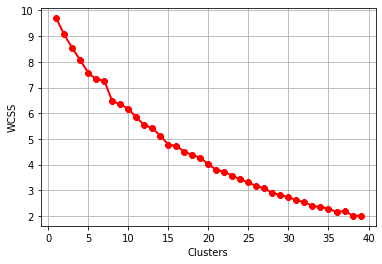

In [40]:
# WCSS is the sum of squares of the distances of data points within a cluster to its centroid
#The minimum value of the WCSS occurs at the optimum number of clusters
wcss = []
Houston_grouped_clustering = Houston_grouped.drop('Neighborhood', 1)
for k in range(1,40):
    km = KMeans(n_clusters=k, init="k-means++")
    km.fit(Houston_grouped_clustering)
    wcss.append(km.inertia_)
#plt.figure(figsize=(12,6))    
plt.grid()
plt.plot(range(1,40),wcss, linewidth=2, color="red", marker ="8")

plt.xlabel("Clusters")
#plt.xticks(np.arange(1,11,1))
plt.ylabel("WCSS")
plt.show()

In [41]:
# Although the WCSS occurs at around 40 clusters, only 5 clusters are used to segment the neighborhoods for simplicity
kclusters = 5

Houston_grouped_clustering = Houston_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Houston_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([3, 3, 0, 3, 3, 3, 3, 3, 3, 0], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [42]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
Houston_merged = df_Houston

# merge Houston_grouped with Houston_data to add latitude/longitude for each neighborhood
Houston_merged = Houston_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

#Some Neighborhoods do not have venues. We will remove them from the DataFrame
Houston_merged=Houston_merged.dropna()
#The Cluster Labels column values were converted to float because of the empty cells(that had nan values). 
#We need to return the labels to integers.
Houston_merged=Houston_merged.astype({"Cluster Labels":"int32"})
Houston_merged.head()



,Neighborhood,ZipCode,Population,MedianIncome,EducationBachelor,MedianAge,Unemployment,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1960/Cypress,77065,38585,56341,27,33.0,5,29.928425,-95.607101,3,Fast Food Restaurant,Mexican Restaurant,Sandwich Place,Hotel,Pharmacy,Coffee Shop,Mobile Phone Shop,Bank,Asian Restaurant,Fried Chicken Joint
1,Aldine Area,77039,28711,37275,4,27.2,9,29.911270,-95.336487,3,Pizza Place,Taco Place,Gas Station,Discount Store,Pool,Grocery Store,Snack Place,Food,Fried Chicken Joint,Donut Shop
2,Alief,77072,59442,37143,13,32.4,10,29.700073,-95.584854,0,Vietnamese Restaurant,Asian Restaurant,Bubble Tea Shop,Gas Station,Discount Store,Cajun / Creole Restaurant,Grocery Store,Noodle House,Seafood Restaurant,Bakery
3,Alvin North,77511,46333,51203,17,34.9,7,29.402740,-95.261040,3,Fast Food Restaurant,Fried Chicken Joint,American Restaurant,Gym / Fitness Center,Park,Grocery Store,Food,Supermarket,Supplement Shop,Baseball Field
4,Alvin South,77511,46333,51203,17,34.9,7,29.402740,-95.261040,3,Fast Food Restaurant,Fried Chicken Joint,American Restaurant,Gym / Fitness Center,Park,Grocery Store,Food,Supermarket,Supplement Shop,Baseball Field


## 5. Examine Clusters

Now, you can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, you can then assign a name to each cluster. I will leave this exercise to you.

In [43]:
Houston_Clusters=Houston_merged.drop(columns=["Latitude", "Longitude"])

#### Cluster 0

In [44]:
Houston_Clusters.loc[Houston_Clusters['Cluster Labels'] == 0]

,Neighborhood,ZipCode,Population,MedianIncome,EducationBachelor,MedianAge,Unemployment,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Alief,77072,59442,37143,13,32.4,10,0,Vietnamese Restaurant,Asian Restaurant,Bubble Tea Shop,Gas Station,Discount Store,Cajun / Creole Restaurant,Grocery Store,Noodle House,Seafood Restaurant,Bakery
9,Baytown/Chambers County,77521,53091,54343,17,31.5,10,0,Sandwich Place,Cosmetics Shop,Breakfast Spot,Department Store,Hotel,Steakhouse,Fried Chicken Joint,Mexican Restaurant,Health & Beauty Service,Chinese Restaurant
12,Bellaire,77401,18130,154053,77,41.2,4,0,Pizza Place,Mexican Restaurant,Coffee Shop,Sandwich Place,Burger Joint,Italian Restaurant,Fast Food Restaurant,American Restaurant,Pharmacy,Bakery
15,Briargrove,77057,40086,52624,52,33.9,5,0,Chinese Restaurant,Burger Joint,American Restaurant,Italian Restaurant,Gym,Dessert Shop,Sporting Goods Shop,Steakhouse,Seafood Restaurant,Grocery Store
16,Briargrove Park/Walnut Bend,77042,38335,45403,45,31.5,7,0,Hotel,Sandwich Place,Grocery Store,Coffee Shop,Bakery,Mexican Restaurant,Breakfast Spot,Pizza Place,Cajun / Creole Restaurant,Taco Place
17,Briarmeadow/Tanglewilde,77063,36299,46611,46,32.9,6,0,Mexican Restaurant,Bakery,BBQ Joint,Japanese Restaurant,Coffee Shop,Food Truck,Middle Eastern Restaurant,Trail,Latin American Restaurant,Sporting Goods Shop
19,Chambers County East,77514,4430,43750,15,41.4,6,0,Sports Bar,Trail,Nature Preserve,Event Space,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant
21,Champions Area,77069,16764,64498,49,47.1,5,0,Coffee Shop,Furniture / Home Store,Bank,Golf Course,Mexican Restaurant,Italian Restaurant,Restaurant,Rental Car Location,Mobile Phone Shop,Miscellaneous Shop
22,Charnwood/Briarbend,77063,36299,46611,46,32.9,6,0,Mexican Restaurant,Bakery,BBQ Joint,Japanese Restaurant,Coffee Shop,Food Truck,Middle Eastern Restaurant,Trail,Latin American Restaurant,Sporting Goods Shop
25,Coldspring/South San Jacinto County,77331,6124,41611,18,54.0,10,0,Golf Course,Home Service,Tennis Court,Harbor / Marina,Burger Joint,Lake,Zoo Exhibit,Ethiopian Restaurant,Dry Cleaner,Dumpling Restaurant


#### Cluster 1

In [45]:
Houston_Clusters.loc[Houston_Clusters['Cluster Labels'] == 1]

,Neighborhood,ZipCode,Population,MedianIncome,EducationBachelor,MedianAge,Unemployment,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
20,Chambers County West,77523,18378,90226,22,33.7,7,1,Construction & Landscaping,Athletics & Sports,Racetrack,Intersection,Event Space,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant
74,La Porte/Shoreacres,77571,36580,69480,15,36.1,8,1,Home Service,Park,Gas Station,Sandwich Place,Construction & Landscaping,Coworking Space,Creperie,Convenience Store,Dumpling Restaurant,Eastern European Restaurant
105,Porter/New Caney West,77365,26175,59071,18,34.1,8,1,Construction & Landscaping,Italian Restaurant,Mexican Restaurant,Fast Food Restaurant,Home Service,Convenience Store,Coworking Space,Fabric Shop,Eastern European Restaurant,Electronics Store
120,Spring Northeast,77386,44686,84940,40,31.5,4,1,Home Service,Recreation Center,Intersection,Construction & Landscaping,Cosmetics Shop,Dosa Place,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant


#### Cluster 2

In [46]:
Houston_Clusters.loc[Houston_Clusters['Cluster Labels'] == 2]

,Neighborhood,ZipCode,Population,MedianIncome,EducationBachelor,MedianAge,Unemployment,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
44,Five Corners,77045,33820,39020,13,30.9,14,2,Gas Station,Mobile Phone Shop,Resort,Donut Shop,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant
103,Plantersville Area,77363,3471,41714,13,38.9,9,2,Financial or Legal Service,Gas Station,American Restaurant,Zoo Exhibit,Eye Doctor,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant


#### Cluster 3

In [47]:
Houston_Clusters.loc[Houston_Clusters['Cluster Labels'] == 3]

,Neighborhood,ZipCode,Population,MedianIncome,EducationBachelor,MedianAge,Unemployment,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,1960/Cypress,77065,38585,56341,27,33.0,5,3,Fast Food Restaurant,Mexican Restaurant,Sandwich Place,Hotel,Pharmacy,Coffee Shop,Mobile Phone Shop,Bank,Asian Restaurant,Fried Chicken Joint
1,Aldine Area,77039,28711,37275,4,27.2,9,3,Pizza Place,Taco Place,Gas Station,Discount Store,Pool,Grocery Store,Snack Place,Food,Fried Chicken Joint,Donut Shop
3,Alvin North,77511,46333,51203,17,34.9,7,3,Fast Food Restaurant,Fried Chicken Joint,American Restaurant,Gym / Fitness Center,Park,Grocery Store,Food,Supermarket,Supplement Shop,Baseball Field
4,Alvin South,77511,46333,51203,17,34.9,7,3,Fast Food Restaurant,Fried Chicken Joint,American Restaurant,Gym / Fitness Center,Park,Grocery Store,Food,Supermarket,Supplement Shop,Baseball Field
5,Atascocita North,77346,57329,87878,36,33.4,5,3,Fast Food Restaurant,BBQ Joint,Gas Station,Grocery Store,Seafood Restaurant,Discount Store,Pizza Place,Pharmacy,Video Game Store,Chinese Restaurant
6,Atascocita South,77396,47623,57440,24,30.8,7,3,Fast Food Restaurant,Pizza Place,Pharmacy,Sandwich Place,Mexican Restaurant,Pool,Chinese Restaurant,Fried Chicken Joint,Gas Station,Gym
7,Bacliff/San Leon,77518,8667,40421,16,31.7,8,3,Convenience Store,Bar,Harbor / Marina,Pizza Place,Mexican Restaurant,Discount Store,Boutique,RV Park,Taco Place,New American Restaurant
8,Bayou Vista,77563,9836,50481,16,43.1,8,3,Fast Food Restaurant,Convenience Store,Carpet Store,Construction & Landscaping,Fried Chicken Joint,BBQ Joint,Sandwich Place,Sporting Goods Shop,Cycle Studio,Fabric Shop
10,Baytown/Harris County,77520,37928,43094,10,32.4,11,3,Mexican Restaurant,Fast Food Restaurant,Discount Store,Pharmacy,Ice Cream Shop,Sandwich Place,Supermarket,BBQ Joint,Bakery,Bank
11,Bear Creek,77449,99450,66550,23,30.4,8,3,Discount Store,Video Store,Convenience Store,Mexican Restaurant,Sports Bar,Food Truck,Liquor Store,Fried Chicken Joint,Donut Shop,Caribbean Restaurant


#### Cluster 4

In [48]:
Houston_Clusters.loc[Houston_Clusters['Cluster Labels'] == 4]

,Neighborhood,ZipCode,Population,MedianIncome,EducationBachelor,MedianAge,Unemployment,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
32,Crystal Beach,77650,1221,92083,31,53.3,5,4,Harbor / Marina,River,Zoo Exhibit,Event Space,Dosa Place,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant


#### Now let's create a color coded map with all Neighborhood clusters

In [57]:
# Matplotlib and associated plotting modules
import matplotlib.cm as cm

map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Houston_merged['Latitude'], Houston_merged['Longitude'], Houston_merged['Neighborhood'], Houston_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       

The list rainbow contains the color codes of the clusters

In [51]:
rainbow

['#8000ff', '#00b5eb', '#80ffb4', '#ffb360', '#ff0000']

#### Let's create a legend to indicate each cluster color

In [58]:
from branca.element import Template, MacroElement

template = """
{% macro html(this, kwargs) %}

<!doctype html>
<html lang="en">
<head>
  <meta charset="utf-8">
  <meta name="viewport" content="width=device-width, initial-scale=1">
  <title>jQuery UI Draggable - Default functionality</title>
  <link rel="stylesheet" href="//code.jquery.com/ui/1.12.1/themes/base/jquery-ui.css">

  <script src="https://code.jquery.com/jquery-1.12.4.js"></script>
  <script src="https://code.jquery.com/ui/1.12.1/jquery-ui.js"></script>
  
  <script>
  $( function() {
    $( "#maplegend" ).draggable({
                    start: function (event, ui) {
                        $(this).css({
                            right: "auto",
                            top: "auto",
                            bottom: "auto"
                        });
                    }
                });
});

  </script>
</head>
<body>

 
<div id='maplegend' class='maplegend' 
    style='position: absolute; z-index:9999; border:2px solid grey; background-color:rgba(255, 255, 255, 0.8);
     border-radius:6px; padding: 10px; font-size:14px; right: 20px; bottom: 20px;'>
     
<div class='legend-title'>Clusters (draggable!)</div>
<div class='legend-scale'>
  <ul class='legend-labels'>
    <li><span style='background:#ff0000;opacity:0.7;'></span>Cluster 0</li>
    <li><span style='background:#8000ff;opacity:0.7;'></span>Cluster 1</li>
    <li><span style='background:#00b5eb;opacity:0.7;'></span>Cluster 2</li>
    <li><span style='background:#80ffb4;opacity:0.7;'></span>Cluster 3</li>
    <li><span style='background:#ffb360;opacity:0.7;'></span>Cluster 4</li>
  </ul>
</div>
</div>
 
</body>
</html>

<style type='text/css'>
  .maplegend .legend-title {
    text-align: left;
    margin-bottom: 5px;
    font-weight: bold;
    font-size: 90%;
    }
  .maplegend .legend-scale ul {
    margin: 0;
    margin-bottom: 5px;
    padding: 0;
    float: left;
    list-style: none;
    }
  .maplegend .legend-scale ul li {
    font-size: 80%;
    list-style: none;
    margin-left: 0;
    line-height: 18px;
    margin-bottom: 2px;
    }
  .maplegend ul.legend-labels li span {
    display: block;
    float: left;
    height: 16px;
    width: 30px;
    margin-right: 5px;
    margin-left: 0;
    border: 1px solid #999;
    }
  .maplegend .legend-source {
    font-size: 80%;
    color: #777;
    clear: both;
    }
  .maplegend a {
    color: #777;
    }
</style>
{% endmacro %}"""

macro = MacroElement()
macro._template = Template(template)

map_clusters.get_root().add_child(macro)

map_clusters

## 5.Provide an example of a venue location selection (Starbucks)

#### Let's now pick a venue and see their location distribution an the map
#### In this case, Starbucks coffee shop is picked
#### The same analysis can be done on any other venue or venue category

Create a Data frame of the Starbucks venues

In [53]:
df_Starbucks=pd.DataFrame(Houston_venues["Neighborhood"].where(Houston_venues["Venue"]=="Starbucks").dropna())
df_Starbucks["Venue Latitude"]=(Houston_venues["Venue Latitude"].where(Houston_venues["Venue"]=="Starbucks").dropna())
df_Starbucks["Venue Longitude"]=(Houston_venues["Venue Longitude"].where(Houston_venues["Venue"]=="Starbucks").dropna())
df_Starbucks["Venue"]=(Houston_venues["Venue"].where(Houston_venues["Venue"]=="Starbucks").dropna())
df_Starbucks

,Neighborhood,Venue Latitude,Venue Longitude,Venue
10,1960/Cypress,29.927676,-95.595000,Starbucks
48,1960/Cypress,29.918660,-95.605045,Starbucks
64,1960/Cypress,29.915823,-95.616450,Starbucks
210,Alvin North,29.398292,-95.249373,Starbucks
236,Alvin South,29.398292,-95.249373,Starbucks
266,Atascocita North,29.997860,-95.177960,Starbucks
318,Atascocita South,29.936126,-95.250034,Starbucks
420,Baytown/Chambers County,29.805185,-94.982956,Starbucks
525,Bellaire,29.707271,-95.468296,Starbucks
589,Bellaire,29.723346,-95.467888,Starbucks


In [54]:
df_Starbucks.shape

(118, 4)

#### Let's create a map that includes both the size of the Population and Income
#### Add the Starbucks venues location to the map
#### Explore new locations that could be attractive for a new venues

In [55]:
# create map of Houston using latitude and longitude values
# Add the Neighborhood locations with markers radius proportion to the product of wealth and population
map_Starbucks = folium.Map(location=[latitude, longitude], zoom_start=9)
# add markers to map
for lat, lng, zipcode, neighborhood, Wealth_population in zip(df_Houston['Latitude'], df_Houston['Longitude'], df_Houston['ZipCode'], df_Houston['Neighborhood'], df_wealthy_populated[0]):
    label = '{}, {}'.format(neighborhood, zipcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=0.000000001*Wealth_population,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Starbucks)  
    
# Add the locations of the Starbucks venues on the map    
for lat, lng, neighborhood in zip(df_Starbucks['Venue Latitude'], df_Starbucks['Venue Longitude'], df_Starbucks['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='red',
        fill=True,
        fill_color='#FF0000',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Starbucks)      
map_Starbucks